In [1]:
import numpy as np
import extq
import matplotlib.pyplot as plt
from matplotlib import ticker
import pyemma
import glob
import sys
import importlib
import gc
import sklearn
from sklearn import metrics
import ivac
import seaborn as sns

In [2]:
sys.path.insert(1, "../../python")
sys.path.insert(1, "../../..")
import util
import kde

In [3]:
from util import *

In [4]:
plt.style.use("seaborn-ticks")
sns.set_palette("colorblind")

# Load data and CVs 

In [5]:
livac_trajs = np.load(
    "../../data/sb_ind100_TICA/livac_trajs_anton.npy", allow_pickle=True
)
ri_trajs = np.load("../../data/raw_feat/ri126_dist_anton.npz.npy", allow_pickle=True)
cv_trajs = np.load("../../data/raw_feat/cv_dist_spin_anton.npy", allow_pickle=True)

In [6]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")

In [7]:
remove = [
    1282,
    1283,
    1284,
    1285,
    1286,
    1288,
    1289,
    1290,
    1187,
    1188,
    1189,
    1190,
    1191,
    1197,
    1198,
    1199,
    1203,
    1205,
    1206,
    1207,
    1211,
    1212,
    1213,
    1214,
    1215,
    1225,
    1226,
    1227,
    1228,
    1231,
    1232,
    1233,
    1236,
    1237,
    1238,
    1242,
    1245,
    1246,
    1252,
    1253,
    1260,
    1261,
    1262,
    1263,
    1266,
    1267,
    1268,
    1269,
    1270,
    1271,
    1272,
    1273,
    1274,
    1275,
    1276,
    1277,
    1278,
    1279,
]

In [8]:
data_trajs = np.load("../../data/raw_feat/feat3_raw_anton.npy", allow_pickle=True)

In [9]:
print(len(livac_trajs), len(ri_trajs), len(data_trajs), len(cv_trajs))

livac_arr = np.concatenate(livac_trajs)
ri_arr = np.concatenate(ri_trajs)
data_arr = np.concatenate(data_trajs)
cv_arr = np.concatenate(cv_trajs)
print(livac_arr.shape, ri_arr.shape, data_arr.shape, cv_arr.shape)

237 237 237 237
(3000000, 5) (3000000, 5) (3000000, 130) (3000000, 2)


In [189]:
ivac_trajs = np.load("../../data/feat2_anton_ivac.npy", allow_pickle=True)
ivac_arr = np.concatenate(ivac_trajs)
print(len(ivac_trajs), ivac_trajs[0].shape)
print(ivac_arr.shape)

237 (10000, 10)
(3000000, 10)


In [11]:
sb_trajs = np.load("../../data/raw_feat/feat2_raw_anton.npy", allow_pickle=True)
sb_arr = np.concatenate(sb_trajs)
print(sb_trajs.shape)
print(sb_arr.shape)

(237,)
(3000000, 60)


# Feat3 distance basis 

## States 

In [22]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb1 = data_arr[:, 42]  # R226-D129
sb2 = data_arr[:, 48]  # R229-D129
sb3 = data_arr[:, 53]  # R229-D186
sb4 = data_arr[:, 54]  # R4 - D129

# ellipse centered at (-0.506, 3.94) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D129 salt bridges < 0.5/> 0.6 nm, R3-D186 < 0.55
up_ids = (
    ((((dist + 0.506) / 0.84) ** 2 + ((rot - 3.94) / 7.6) ** 2) < 1)
    & (sb1 < 0.5)
    & (sb2 > 0.6)
    & (sb3 < 0.55)
    & (tic2 > -1)
).nonzero()[0]

# ellipse centered at (6.447, 60.713) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 < -1.25
dist_ax_upp = (dist - 6.447) / 0.632
rot_ax_upp = (rot - 60.713) / 4.0
upplus_ids = (
    ((dist_ax_upp ** 2 + rot_ax_upp ** 2) < 1) & (tic1 < -1.25) & (sb4 < 1.0)
).nonzero()[0]

In [23]:
mask = np.ones(len(cv_arr), dtype=bool)
mask[upplus_ids] = False
mask[up_ids] = False

# len(**_ids) is number of points in each state
upplus = data_arr[upplus_ids]
up = data_arr[up_ids]
other = data_arr[mask]

# split CV data
upplus_cvs = cv_arr[upplus_ids]
up_cvs = cv_arr[up_ids]
other_cvs = cv_arr[mask]
upplus_sbs = sb_arr[upplus_ids]
up_sbs = sb_arr[up_ids]
other_sbs = cv_arr[mask]

In [24]:
assert (len(upplus) + len(up) + len(other)) == len(cv_arr)
print(f"Number of up+ structures:  {len(upplus)}")
print(f"Number of up structures:   {len(up)}")
print(f"Number of other structures: {len(other)}")

Number of up+ structures:  6946
Number of up structures:   3396
Number of other structures: 2989658


## Pairwise distances 

In [15]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

### Up state 

In [21]:
d_up = []
counter = 0.0
tot = len(data_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, up[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

1.32% completed
2.63% completed
3.95% completed
5.27% completed
6.59% completed
7.90% completed
9.22% completed
10.54% completed
11.86% completed
13.17% completed
14.49% completed
15.81% completed
17.13% completed
18.44% completed
19.76% completed
21.08% completed
22.40% completed
23.71% completed
25.03% completed
26.35% completed
27.67% completed
28.98% completed
30.30% completed
31.62% completed
32.93% completed
34.25% completed
35.57% completed
36.89% completed
38.20% completed
39.52% completed
40.84% completed
42.16% completed
43.47% completed
44.79% completed
46.11% completed
47.43% completed
48.74% completed
50.06% completed
51.38% completed
52.70% completed
54.01% completed
55.33% completed
56.65% completed
57.97% completed
59.28% completed
60.60% completed
61.92% completed
63.24% completed
64.55% completed
65.87% completed
67.19% completed
68.50% completed
69.82% completed
71.14% completed
72.46% completed
73.77% completed
75.09% completed
76.41% completed
77.73% completed
79.0

In [22]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids]))
d_up_arr[up_ids] = 0
print(np.max(d_up_arr[up_ids]))

print(d_up_arr.shape)

76 (39522,)
(3000000, 1)
9.536743e-07
0.0
(3000000, 1)


In [23]:
np.save("../../data/feat3_dist_anton_uu/dist_up", d_up_arr)

### Up+ state

In [24]:
d_upplus = []
counter = 0.0

for chunk in metrics.pairwise_distances_chunked(
    data_arr, upplus[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upplus.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.64% completed
1.29% completed
1.93% completed
2.58% completed
3.22% completed
3.86% completed
4.51% completed
5.15% completed
5.80% completed
6.44% completed
7.09% completed
7.73% completed
8.37% completed
9.02% completed
9.66% completed
10.31% completed
10.95% completed
11.59% completed
12.24% completed
12.88% completed
13.53% completed
14.17% completed
14.81% completed
15.46% completed
16.10% completed
16.75% completed
17.39% completed
18.03% completed
18.68% completed
19.32% completed
19.97% completed
20.61% completed
21.26% completed
21.90% completed
22.54% completed
23.19% completed
23.83% completed
24.48% completed
25.12% completed
25.76% completed
26.41% completed
27.05% completed
27.70% completed
28.34% completed
28.98% completed
29.63% completed
30.27% completed
30.92% completed
31.56% completed
32.20% completed
32.85% completed
33.49% completed
34.14% completed
34.78% completed
35.43% completed
36.07% completed
36.71% completed
37.36% completed
38.00% completed
38.65% compl

In [25]:
print(len(d_upplus), d_upplus[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upplus_arr = np.reshape(np.concatenate(d_upplus), (-1, 1))

print(np.max(d_upplus_arr[upplus_ids]))
d_upplus_arr[upplus_ids] = 0
assert np.max(d_upplus_arr[upplus_ids]) == 0

print(d_upplus_arr.shape)

156 (19323,)
8.9208066e-07
(3000000, 1)


In [26]:
np.save("../../data/feat3_dist_anton_uu/dist_upp", d_upplus_arr)

## Basis set construction 

In [28]:
# make smoothing function
smooth = (d_up_arr * d_upplus_arr) ** 0.5 / (d_up_arr + d_upplus_arr)

# make guess
guess_up = (d_upplus_arr / (d_up_arr + d_upplus_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upplus_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
mask = np.ones(len(data_arr), dtype=bool)
mask[up_ids] = False
mask[upplus_ids] = False
smooth[(mask == 0).flatten()] = 0

# ensure homogeneous boundary conditions for guess
guess_up[up_ids] = 1
guess_up[upplus_ids] = 0
guess_upp[upplus_ids] = 1
guess_upp[up_ids] = 0

In [29]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(3000000, 1) (3000000, 1) (3000000, 1)


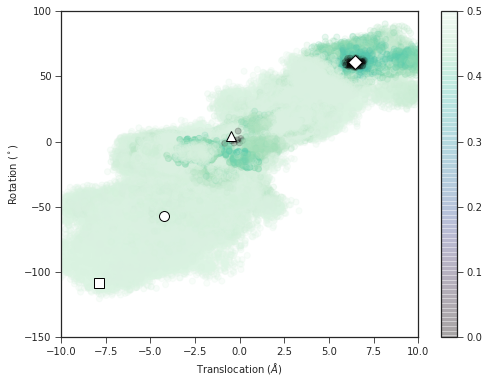

In [30]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako")
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

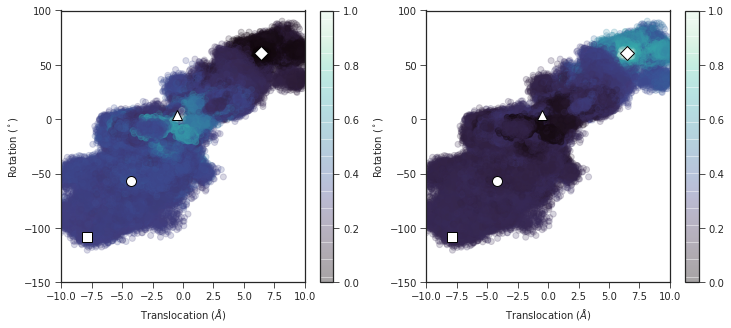

In [31]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [32]:
def svd_whiten(X, num_retain=None):
    U, L, V = np.linalg.svd(X, full_matrices=False)
    if num_retain is None:
        return U
    else:
        return U[:, :num_retain]

In [34]:
basis_smooth = smooth * data_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(3000000, 130)
(3000000, 130)


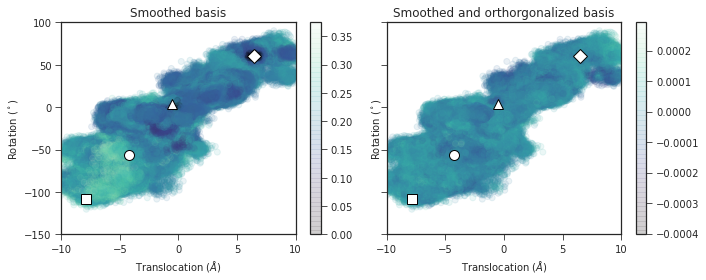

In [36]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [20]:
traj_lens = [len(traj) for traj in cv_trajs]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)

In [38]:
basisF = np.split(basis_white, traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), traj_inds)
guessU = np.split(np.squeeze(guess_upp), traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (10000, 130)
237
237


## Weights 

In [39]:
# unit is 0.1 ps, up to 500 ns
lags = [1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000]

In [40]:
weights = np.load("../../data/coms_feat5_ind200_anton.npy", allow_pickle=True)
print(len(weights), weights[0].shape, weights[0][0].shape)

14 (237,) (10000,)


## committors

In [41]:
in_domain = np.split(mask, traj_inds)
in_domain[0].shape

(10000,)

In [42]:
q_downup, q_updown, qb_downup, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000


In [43]:
np.save("../../data/feat3_dist_anton_uu/q_downup", q_downup)
np.save("../../data/feat3_dist_anton_uu/qb_downup", qb_downup)
np.save("../../data/feat3_dist_anton_uu/q_updown", q_updown)
np.save("../../data/feat3_dist_anton_uu/qb_updown", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


### Forward committor

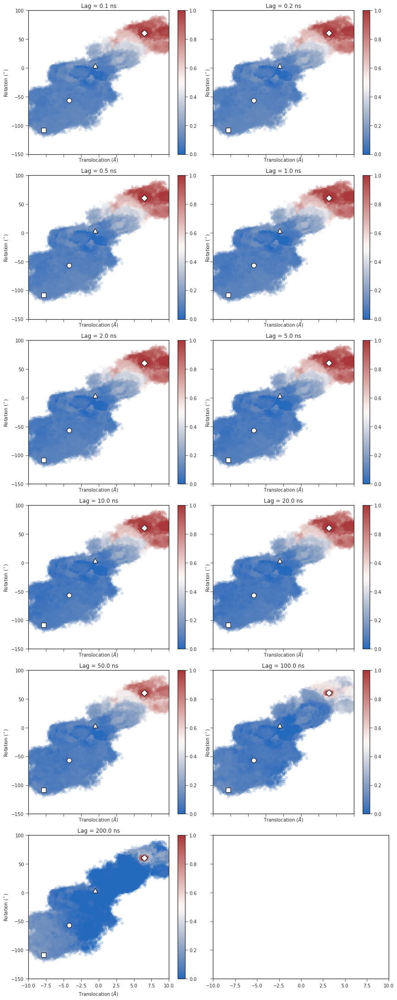

In [44]:
s = 10
f, axs = plt.subplots(6, 2, figsize=(12, 30), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*cv_arr[::s].T, c=q_arr[::s], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax, centroids=True)
f.tight_layout()

In [169]:
# useful salt bridges for up to up+ transition
# R229-D129, R232-D129, R229-D186, R232-D186
sb_ids = [48, 54, 53, 59]

In [170]:
from itertools import combinations

In [171]:
feat2_models = np.load("../../data/models_centroids_feat2.npy")

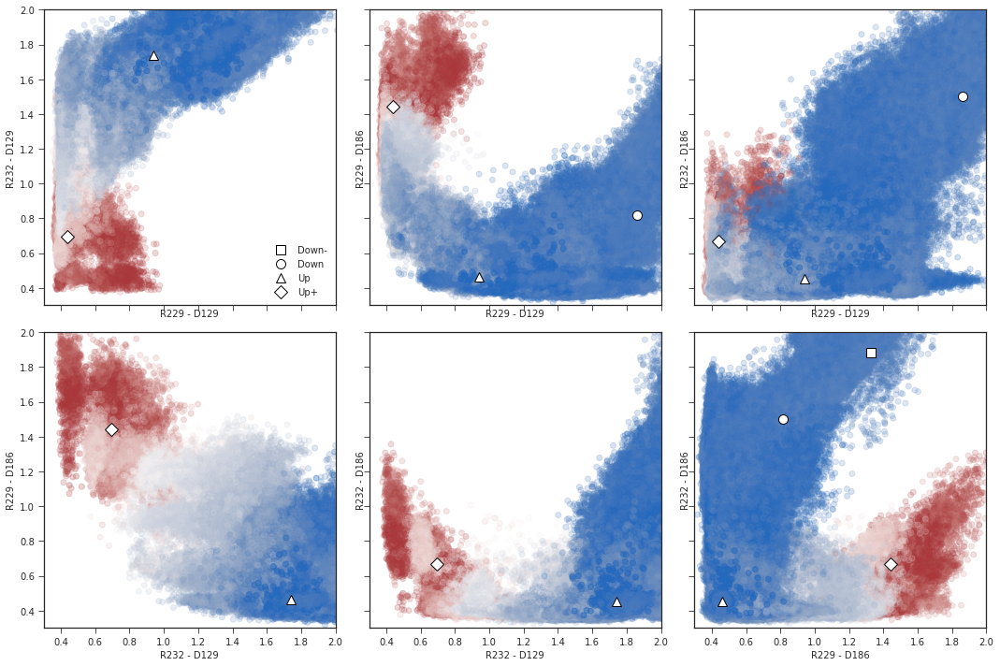

In [48]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(
        sb_arr[::10, sb1], sb_arr[::10, sb2], c=q_arr[::10], cmap="vlag", alpha=0.2
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])

f.tight_layout()

In [184]:
import pickle

In [185]:
with open("../../data/livac-feat2-anton.pkl", mode="rb") as f:
    livac = pickle.load(f)
ivac_models = livac.transform([feat2_models])[0]

In [186]:
f, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True)
q_arr = np.concatenate(q_downup[7]).clip(min=0.0, max=1.0)
for i, ax in enumerate(axes):
    ax.scatter(
        ivac_arr[::s, 1], ivac_arr[::s, i + 2], c=q_arr[::s], cmap="vlag", alpha=0.2
    )
    ax.set(xlabel=f"iTIC 1", ylabel=f"iTIC {i + 2}")
util.plot_models(axes[0], ivac_models[:, 1:3])
util.plot_models(axes[1], ivac_models[:, 1:4:2])
util.plot_models(axes[2], ivac_models[:, 1:5:3])
axes[0].legend(["Down-", "Down", "Up", "Up+"])

f.tight_layout()

<IPython.core.display.Javascript object>

### 3d projections

In [53]:
%matplotlib notebook

<IPython.core.display.Javascript object>


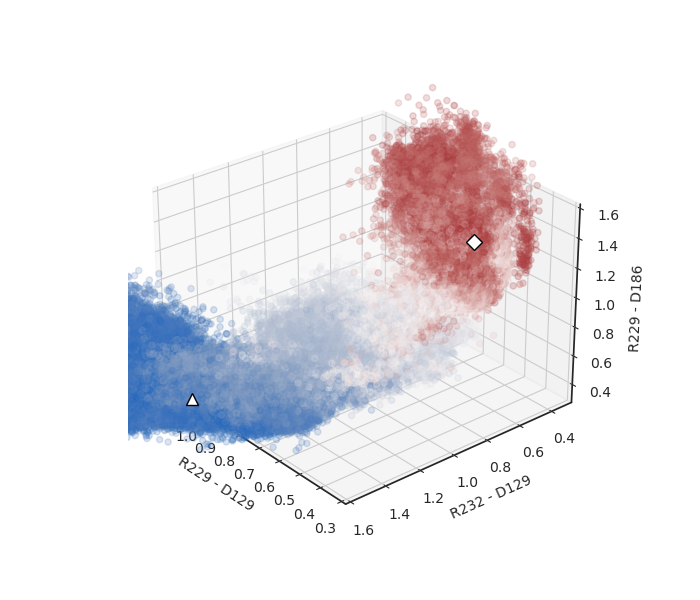

In [58]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[7]).clip(min=0, max=1)
ax.scatter(
    data_arr[::10, sb_ids[0]],
    data_arr[::10, sb_ids[1]],
    data_arr[::10, sb_ids[2]],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
ax.set_xlabel(sb_labels[sb_ids[0] - 30])
ax.set_ylabel(sb_labels[sb_ids[1] - 30])
ax.set_zlabel(sb_labels[sb_ids[2] - 30])
ax.set_xlim([0.3, 1.2])
ax.set_ylim([0.3, 1.6])
ax.set_zlim([0.3, 1.6])

ax.plot(
    feat2_models[3, sb_ids[0]],
    feat2_models[3, sb_ids[1]],
    feat2_models[3, sb_ids[2]],
    "D",
    mec="k",
    mfc="w",
    ms=8,
)
ax.plot(
    feat2_models[2, sb_ids[0]],
    feat2_models[2, sb_ids[1]],
    feat2_models[2, sb_ids[2]],
    "^",
    mec="k",
    mfc="w",
    ms=8,
)
ax.view_init(elev=20, azim=140)

plt.show()

<IPython.core.display.Javascript object>


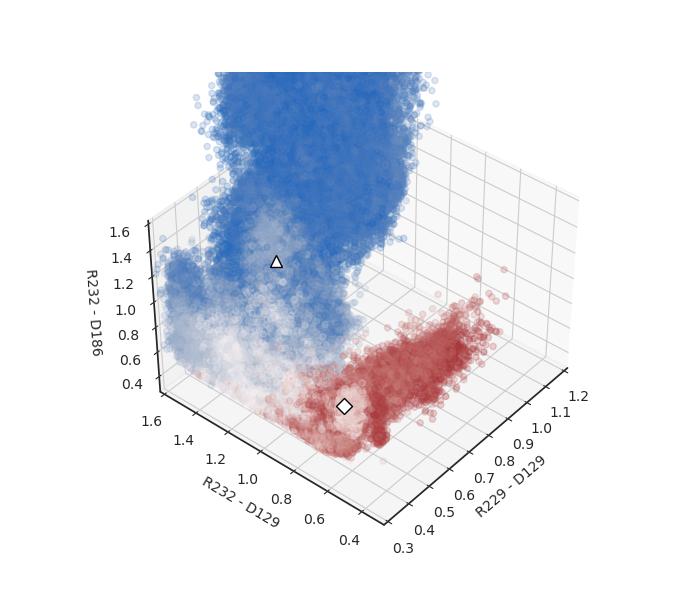

In [61]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[7]).clip(min=0, max=1)
ax.scatter(
    data_arr[::10, sb_ids[0]],
    data_arr[::10, sb_ids[1]],
    data_arr[::10, sb_ids[3]],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
ax.set_xlabel(sb_labels[sb_ids[0] - 30])
ax.set_ylabel(sb_labels[sb_ids[1] - 30])
ax.set_zlabel(sb_labels[sb_ids[3] - 30])
ax.set_xlim([0.3, 1.2])
ax.set_ylim([0.3, 1.6])
ax.set_zlim([0.3, 1.6])

ax.plot(
    feat2_models[3, sb_ids[0]],
    feat2_models[3, sb_ids[1]],
    feat2_models[3, sb_ids[3]],
    "D",
    mec="k",
    mfc="w",
    ms=8,
)
ax.plot(
    feat2_models[2, sb_ids[0]],
    feat2_models[2, sb_ids[1]],
    feat2_models[2, sb_ids[3]],
    "^",
    mec="k",
    mfc="w",
    ms=8,
)
ax.view_init(elev=40, azim=-140)

plt.show()

<IPython.core.display.Javascript object>


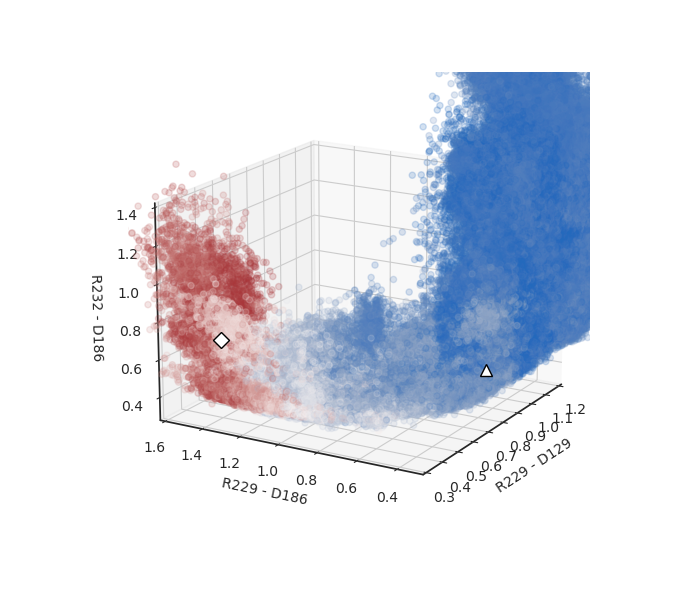

In [62]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[7]).clip(min=0, max=1)
ax.scatter(
    data_arr[::10, sb_ids[0]],
    data_arr[::10, sb_ids[2]],
    data_arr[::10, sb_ids[3]],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
ax.set_xlabel(sb_labels[sb_ids[0] - 30])
ax.set_ylabel(sb_labels[sb_ids[2] - 30])
ax.set_zlabel(sb_labels[sb_ids[3] - 30])
ax.set_xlim([0.3, 1.2])
ax.set_ylim([0.3, 1.6])
ax.set_zlim([0.3, 1.4])

ax.plot(
    feat2_models[3, sb_ids[0]],
    feat2_models[3, sb_ids[2]],
    feat2_models[3, sb_ids[3]],
    "D",
    mec="k",
    mfc="w",
    ms=8,
)
ax.plot(
    feat2_models[2, sb_ids[0]],
    feat2_models[2, sb_ids[2]],
    feat2_models[2, sb_ids[3]],
    "^",
    mec="k",
    mfc="w",
    ms=8,
)
# ax.view_init(elev=40, azim=-140)

plt.show()

<IPython.core.display.Javascript object>


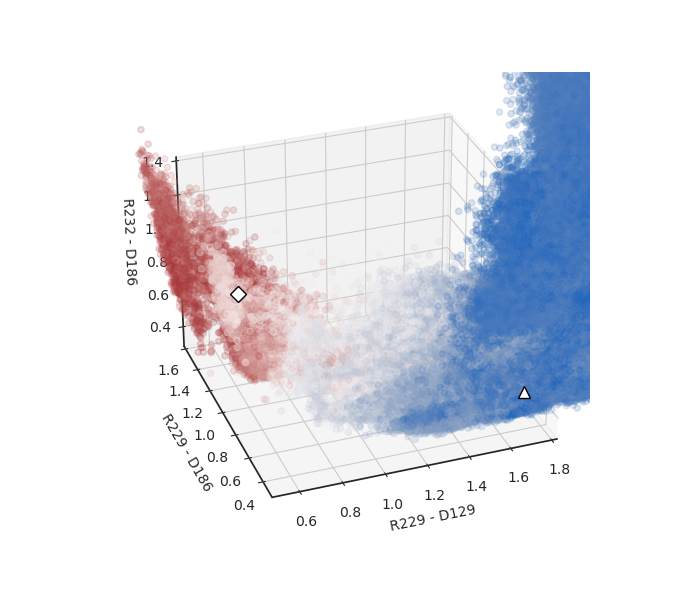

In [63]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[7]).clip(min=0, max=1)
ax.scatter(
    data_arr[::10, sb_ids[1]],
    data_arr[::10, sb_ids[2]],
    data_arr[::10, sb_ids[3]],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
ax.set_xlabel(sb_labels[sb_ids[0] - 30])
ax.set_ylabel(sb_labels[sb_ids[2] - 30])
ax.set_zlabel(sb_labels[sb_ids[3] - 30])
ax.set_xlim([0.5, 1.8])
ax.set_ylim([0.3, 1.6])
ax.set_zlim([0.3, 1.4])

ax.plot(
    feat2_models[3, sb_ids[1]],
    feat2_models[3, sb_ids[2]],
    feat2_models[3, sb_ids[3]],
    "D",
    mec="k",
    mfc="w",
    ms=8,
)
ax.plot(
    feat2_models[2, sb_ids[1]],
    feat2_models[2, sb_ids[2]],
    feat2_models[2, sb_ids[3]],
    "^",
    mec="k",
    mfc="w",
    ms=8,
)
ax.view_init(elev=30, azim=-110)

plt.show()

In [64]:
centroids = np.loadtxt("../../models/MD-clustering-center/all.txt")

<IPython.core.display.Javascript object>


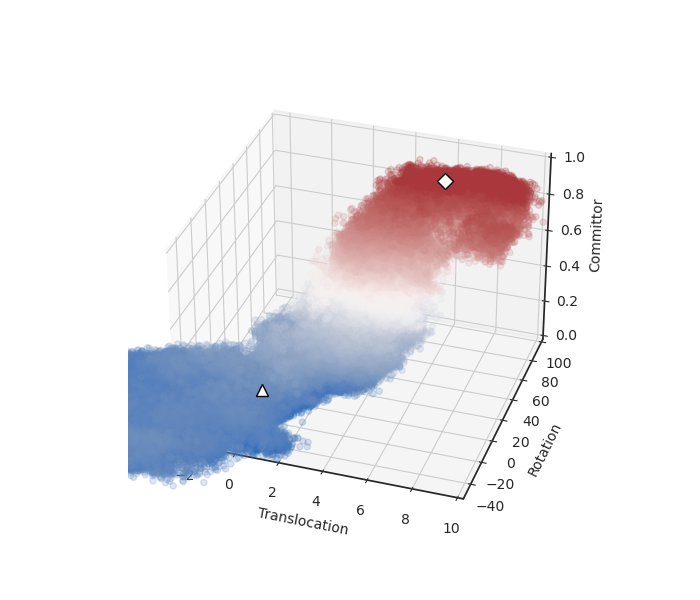

In [66]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

s = 10
q = np.concatenate(q_downup[7]).clip(min=0, max=1)
ax.scatter(cv_arr[::s, 0], cv_arr[::s, 1], q[::s], c=q[::10], cmap="vlag", alpha=0.2)
ax.set_xlabel("Translocation")
ax.set_ylabel("Rotation")
ax.set_zlabel("Committor")
ax.set_xlim([-2.5, 10])
ax.set_ylim([-50, 100])
ax.set_zlim([0, 1.0])

ax.plot(centroids[3, 0], centroids[3, 1], 1, "D", mec="k", mfc="w", ms=8)
ax.plot(centroids[2, 0], centroids[2, 1], 0, "^", mec="k", mfc="w", ms=8)

# Delay embedding

**7.9.21**

In [16]:
n_embed = 20
lag = 10
# use smaller input feature set
# R223-D129, R226-D129, R226-D186, R229-D129, R229-D186, R232-D186
sb_ids = [36, 42, 47, 48, 53, 59]
data_orig = [traj[:, sb_ids] for traj in sb_trajs]
embed_trajs = delay_embed(data_orig, n_embed, lag)
embed_arr = np.concatenate(embed_trajs)

print(data_orig[0].shape)
print(len(embed_trajs), embed_trajs[0].shape)
print(embed_arr.shape)

(10000, 6)
237 (9800, 126)
(2952600, 126)


In [20]:
# len(**_ids) is number of points in each state
# split into lists of trajectories
upplus = np.zeros(len(cv_arr), dtype=np.float)
upplus[upplus_ids] = True
upplus = np.split(upplus, traj_inds)
up = np.zeros(len(cv_arr), dtype=np.float)
up[up_ids] = True
up = np.split(up, traj_inds)

In [21]:
# delay embed indicator functions for states
lifted_up = lift_function(up, n_embed, lag=lag)
lifted_upplus = lift_function(upplus, n_embed, lag=lag)
print(len(lifted_up), lifted_up[0].shape)
print(len(lifted_upplus), lifted_upplus[0].shape)

237 (9800,)
237 (9800,)


In [22]:
print(len(up_ids), len(upplus_ids))

3396 6946


In [23]:
# lift CV data
lifted_cv_trajs = lift_function(cv_trajs, n_embed, lag=lag)
lifted_sb_trajs = lift_function(sb_trajs, n_embed, lag=lag)
lifted_ivac_trajs = lift_function(ivac_trajs, n_embed, lag=lag)
print(len(lifted_cv_trajs), lifted_cv_trajs[0].shape)
print(len(lifted_sb_trajs), lifted_sb_trajs[0].shape)
print(len(lifted_ivac_trajs), lifted_ivac_trajs[0].shape)

237 (9800, 2)
237 (9800, 60)
237 (9800, 10)


In [24]:
lifted_cvs = np.concatenate(lifted_cv_trajs)
lifted_sbs = np.concatenate(lifted_sb_trajs)
lifted_ivac = np.concatenate(lifted_ivac_trajs)
print(lifted_cvs.shape, lifted_sbs.shape, lifted_ivac.shape)

(2952600, 2) (2952600, 60) (2952600, 10)


In [25]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

# new up and upplus ids
up_arr = np.concatenate(lifted_up)
up_ids_lifted = up_arr.nonzero()[0]
upplus_arr = np.concatenate(lifted_upplus)
upplus_ids_lifted = upplus_arr.nonzero()[0]

# states in data
up_data = embed_arr[up_ids_lifted]
upplus_data = embed_arr[upplus_ids_lifted]
print(len(up_data), len(upplus_data))

2904 6816


## Pairwise distances 

### Up state 

In [26]:
d_up = []
counter = 0.0
tot = len(data_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, up_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

1.54% completed
3.08% completed
4.62% completed
6.16% completed
7.70% completed
9.24% completed
10.78% completed
12.32% completed
13.87% completed
15.41% completed
16.95% completed
18.49% completed
20.03% completed
21.57% completed
23.11% completed
24.65% completed
26.19% completed
27.73% completed
29.27% completed
30.81% completed
32.35% completed
33.89% completed
35.43% completed
36.97% completed
38.52% completed
40.06% completed
41.60% completed
43.14% completed
44.68% completed
46.22% completed
47.76% completed
49.30% completed
50.84% completed
52.38% completed
53.92% completed
55.46% completed
57.00% completed
58.54% completed
60.08% completed
61.62% completed
63.16% completed
64.71% completed
66.25% completed
67.79% completed
69.33% completed
70.87% completed
72.41% completed
73.95% completed
75.49% completed
77.03% completed
78.57% completed
80.11% completed
81.65% completed
83.19% completed
84.73% completed
86.27% completed
87.81% completed
89.35% completed
90.90% completed
92.

In [28]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids_lifted]))
d_up_arr[up_ids_lifted] = 0
print(np.max(d_up_arr[up_ids_lifted]))

print(d_up_arr.shape)

64 (46218,)
(2952600, 1)
2.9200194e-07
0.0
(2952600, 1)


In [29]:
np.save("../../data/delay_embed/sb6_1ns_20embed/dist_up_uu", d_up_arr)

### Up+ state

In [30]:
d_upplus = []
counter = 0.0

for chunk in metrics.pairwise_distances_chunked(
    embed_arr, upplus_data[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upplus.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.66% completed
1.31% completed
1.97% completed
2.63% completed
3.28% completed
3.94% completed
4.59% completed
5.25% completed
5.91% completed
6.56% completed
7.22% completed
7.88% completed
8.53% completed
9.19% completed
9.85% completed
10.50% completed
11.16% completed
11.81% completed
12.47% completed
13.13% completed
13.78% completed
14.44% completed
15.10% completed
15.75% completed
16.41% completed
17.07% completed
17.72% completed
18.38% completed
19.03% completed
19.69% completed
20.35% completed
21.00% completed
21.66% completed
22.32% completed
22.97% completed
23.63% completed
24.29% completed
24.94% completed
25.60% completed
26.25% completed
26.91% completed
27.57% completed
28.22% completed
28.88% completed
29.54% completed
30.19% completed
30.85% completed
31.51% completed
32.16% completed
32.82% completed
33.47% completed
34.13% completed
34.79% completed
35.44% completed
36.10% completed
36.76% completed
37.41% completed
38.07% completed
38.73% completed
39.38% compl

In [31]:
print(len(d_upplus), d_upplus[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upplus_arr = np.reshape(np.concatenate(d_upplus), (-1, 1))

print(np.max(d_upplus_arr[upplus_ids_lifted]))
d_upplus_arr[upplus_ids_lifted] = 0
assert np.max(d_upplus_arr[upplus_ids_lifted]) == 0

print(d_upplus_arr.shape)

150 (19691,)
5.3312016e-07
(2952600, 1)


In [32]:
np.save("../../data/delay_embed/sb6_1ns_20embed/dist_upp_uu", d_upplus_arr)

## Basis set construction 

In [33]:
# make smoothing function
smooth = (d_up_arr * d_upplus_arr) ** 0.5 / (d_up_arr + d_upplus_arr)

# make guess
guess_up = (d_upplus_arr / (d_up_arr + d_upplus_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upplus_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
mask = np.ones(len(embed_arr), dtype=bool)
mask[up_ids_lifted] = False
mask[upplus_ids_lifted] = False
smooth[(mask == 0).flatten()] = 0

# ensure homogeneous boundary conditions for guess
guess_up[up_ids_lifted] = 1
guess_up[upplus_ids_lifted] = 0
guess_upp[upplus_ids_lifted] = 1
guess_upp[up_ids_lifted] = 0

In [41]:
assert np.count_nonzero(up_arr) + np.count_nonzero(upplus_arr) + np.count_nonzero(
    mask
) == len(embed_arr)

In [34]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(2952600, 1) (2952600, 1) (2952600, 1)


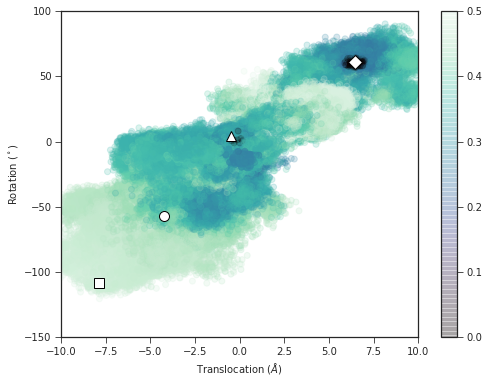

In [35]:
# Plot smoothing function
s = 10
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(
    lifted_cvs[::s, 0], lifted_cvs[::s, 1], c=smooth[::s], alpha=0.2, cmap="mako"
)
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

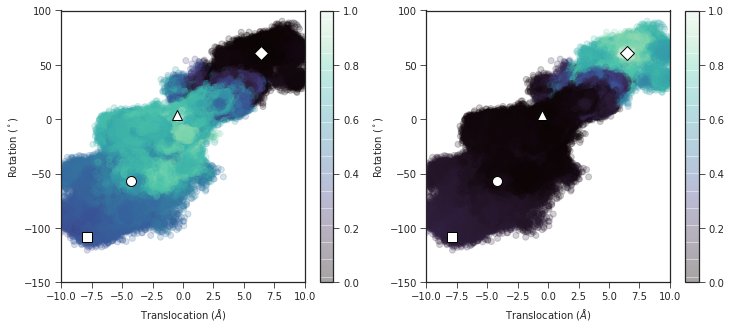

In [36]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    lifted_cvs[::s, 0], lifted_cvs[::s, 1], c=guess_up[::s], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    lifted_cvs[::s, 0], lifted_cvs[::s, 1], c=guess_upp[::s], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [37]:
def svd_whiten(X, num_retain=None):
    U, L, V = np.linalg.svd(X, full_matrices=False)
    if num_retain is None:
        return U
    else:
        return U[:, :num_retain]

In [38]:
basis_smooth = smooth * embed_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(2952600, 126)
(2952600, 126)


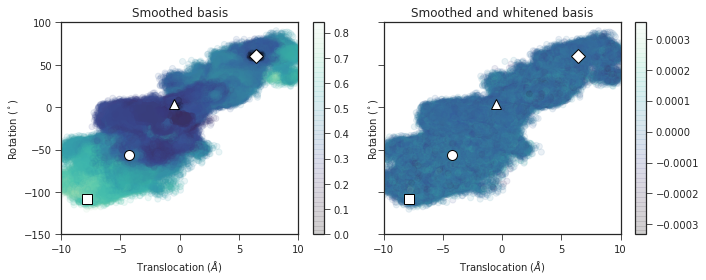

In [42]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(s, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    lifted_cvs[::s, 0],
    lifted_cvs[::s, 1],
    c=np.mean(basis_smooth[::s, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    lifted_cvs[::s, 0],
    lifted_cvs[::s, 1],
    c=np.mean(basis_white[::s, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and whitened basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [43]:
lifted_traj_lens = [len(traj) for traj in embed_trajs]
lifted_traj_inds = []
subtot = 0
for length in lifted_traj_lens[:-1]:
    subtot += length
    lifted_traj_inds.append(subtot)

In [44]:
basisF = np.split(basis_white, lifted_traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), lifted_traj_inds)
guessU = np.split(np.squeeze(guess_upp), lifted_traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (9800, 126)
237
237


## Weights

In [45]:
# unit is 0.1 ps, up to 500 ns
lags = [1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000]

In [46]:
weights = np.load("../../data/delay_embed/sb6_1ns_20embed/coms.npy", allow_pickle=True)[
    :11
]

In [47]:
print(len(weights), len(weights[0]), weights[0][0].shape)

12 237 (9800,)


## Committors

In [48]:
in_domain = np.split(mask, lifted_traj_inds)
in_domain[0].shape

(9800,)

In [49]:
q_downup, q_updown, qb_downup, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000
Calculating committors for lag 5000


AssertionError: 

In [50]:
np.save("../../data/delay_embed/sb6_1ns_20embed/q_downup_uu", q_downup[:11])
np.save("../../data/delay_embed/sb6_1ns_20embed/qb_downup_uu", qb_downup[:11])
np.save("../../data/delay_embed/sb6_1ns_20embed/q_updown_uu", q_updown[:11])
np.save("../../data/delay_embed/sb6_1ns_20embed/qb_updown_uu", qb_updown[:11])

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


### Forward committor

In [53]:
len(q_downup)

11

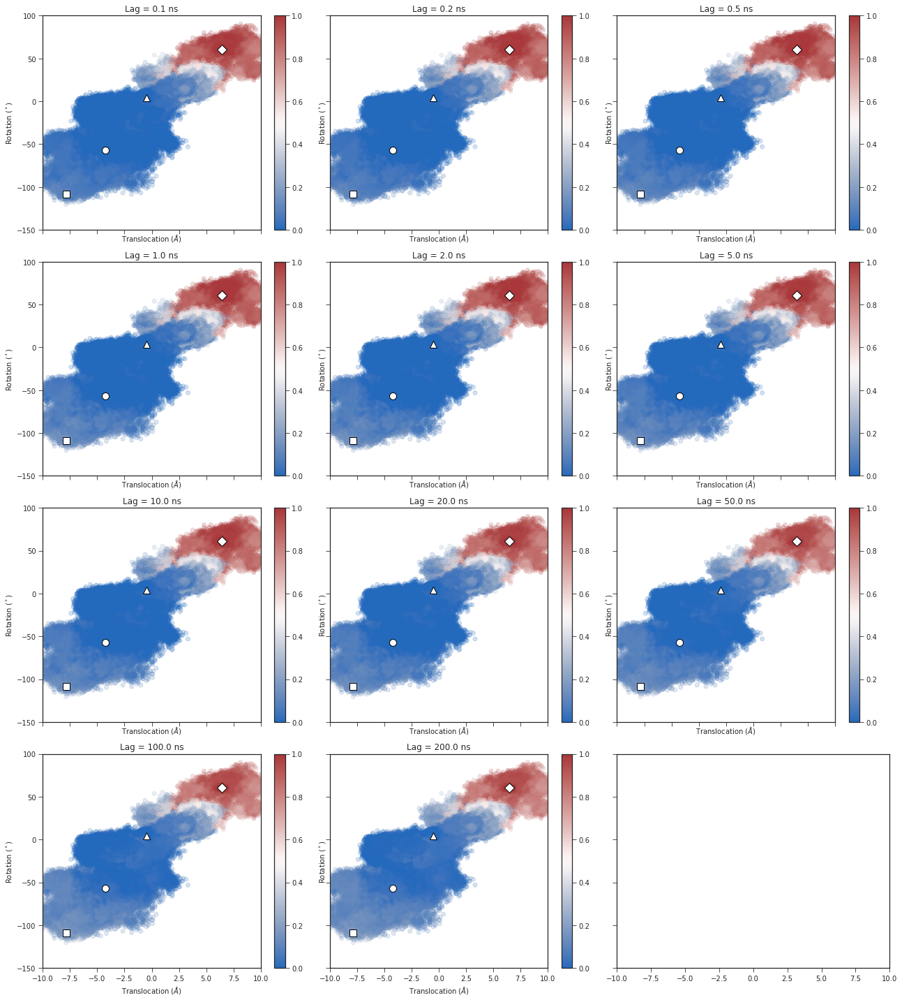

In [54]:
s = 10
f, axs = plt.subplots(4, 3, figsize=(18, 20), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*lifted_cvs[::s].T, c=q_arr[::s], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax, centroids=True)
f.tight_layout()

In [55]:
# useful salt bridges for up to up+ transition
# R229-D129, R232-D129, R229-D186, R232-D186
sb_ids = [48, 54, 53, 59]

In [56]:
from itertools import combinations

In [57]:
feat2_models = np.load("../../data/models_centroids_feat2.npy")

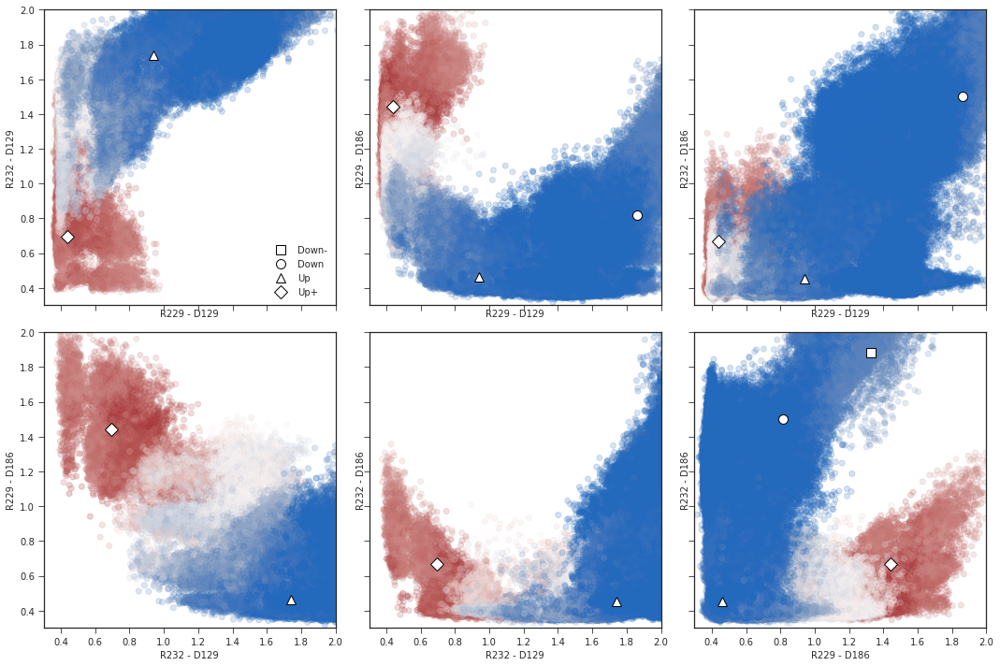

In [58]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(
        lifted_sbs[::10, sb1],
        lifted_sbs[::10, sb2],
        c=q_arr[::10],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])

f.tight_layout()

# Indicator basis 

## TICA/IVAC 

In [117]:
with np.load("../../data/raw_feat/feat5_raw.npz", allow_pickle=True) as f:
    feat5_trajs = f["arr_0"]
feat5_trajs = list(feat5_trajs)
for idx in sorted(remove, reverse=True):
    del feat5_trajs[idx]
feat5_trajs = feat5_trajs[1000:]
print(len(feat5_trajs), feat5_trajs[0].shape)

237 (10000, 1924)


In [118]:
# dimensionality reduce using TICA
livac = ivac.LinearIVAC(minlag=1, maxlag=10000, nevecs=10, addones=False, adjust=True)
livac.fit(feat5_trajs)
ivac_trajs = livac.transform(feat5_trajs)
ivac_arr = np.concatenate(ivac_trajs)
print(ivac_arr.shape)

(3000000, 10)


In [119]:
np.save("../../feat5_ivac_anton", ivac_trajs)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [41]:
ivac_trajs = np.load("../../feat5_ivac_anton.npy", allow_pickle=True)

In [42]:
ivac_arr = np.concatenate(ivac_trajs)
print(ivac_arr.shape)

(3000000, 10)


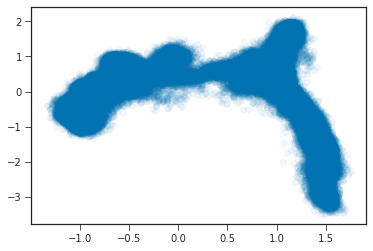

In [43]:
plt.scatter(ivac_arr[::10, 1], ivac_arr[::10, 2], alpha=0.05)

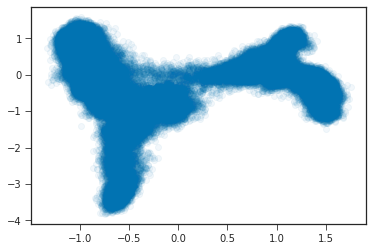

In [44]:
plt.scatter(ivac_arr[::10, 1], ivac_arr[::10, 3], alpha=0.05)

## Clustering 

In [120]:
# cluster IVAC/TICA data
km = pyemma.coordinates.cluster_mini_batch_kmeans(
    data=ivac_arr, k=500, max_iter=100, n_jobs=38
)

09-07-21 15:07:13 pyemma.coordinates.clustering.kmeans.MiniBatchKmeansClustering[2] INFO     Cluster centers converged after 57 steps.


In [121]:
dtrajs = km.dtrajs[0]

In [159]:
np.save("../../data/raw_feat/feat5_ivac_ind500_anton", dtrajs)

In [156]:
dtrajs = np.load("../../data/raw_feat/feat5_ivac_ind500_anton.npy")

In [157]:
dtrajs.shape

(3000000,)

## Basis construction 

In [14]:
from scipy import sparse

In [15]:
dtrajs[:10]

array([148, 354, 439, 439, 310, 310, 439, 439, 439, 439], dtype=int32)

(array([14666., 10340.,  7725.,  4337.,  4094., 12321.,  3868.,  7194.,
         5201.,  5895.,  4233.,  5263.,  9139.,  3369.,  4923.,  1622.,
         4666.,  6517.,  3990.,  3203.,  6746.,  2432.,  4546.,  3675.,
         9415.,  7295.,  1770.,  9082.,  4392.,  5801.,  6191.,  3513.,
        13384.,  7406.,  7079.,  5391.,  4870.,  3226.,  8329.,  4933.,
         2611., 14188.,  5588.,  5943.,  3639., 18578.,  4026.,  2069.,
         6394., 10091.,  3601.,  2421.,  4697.,  5242.,  5619.,  2085.,
         2363.,  6170.,  9082.,  5151.,  2620.,  5386., 10955.,  6252.,
        11101.,  1971.,  4365.,  4970.,  4443.,  7563., 12628., 16885.,
         8122., 16866.,  7991.,  7067.,  8696.,  8400.,  5945.,  3343.,
         3463.,  4556.,  4387.,  3448.,  3804.,  7517.,  7648.,  4789.,
         4616.,  2125.,  1919.,  5243.,  3114.,  6030.,  6490.,  7269.,
         3174.,  4997.,  4504.,  5435.,  7575.,  7649.,  4161.,  6068.,
         6186.,  9459.,  2217.,  8053.,  4913.,  3898.,  7242., 

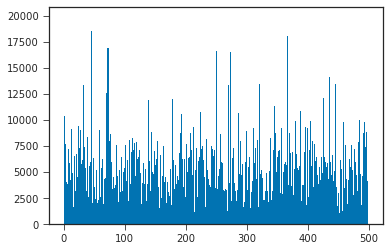

In [48]:
plt.hist(dtrajs, bins=499)

In [66]:
(dtrajs == 490).astype(np.int8)

array([1, 1, 1, ..., 0, 0, 0], dtype=int8)

In [16]:
len(cv_arr)

3000000

In [158]:
# assemble basis using sparse matrices
nclusters = 500

rows, cols = [], []
for i in range(nclusters):
    pts = np.argwhere(dtrajs == i)
    # indices of which frames are in the cluster i
    rows.append(pts.squeeze())
    # all assigned as 1 in the basis
    cols.append(np.repeat(i, len(pts)))
rows = np.hstack(rows)
cols = np.hstack(cols)
data = np.ones(len(rows), dtype=float)
basis = sparse.csr_matrix((data, (rows, cols)), shape=(len(cv_arr), nclusters))

In [54]:
(cols >= 2999999).nonzero()

(array([], dtype=int64),)

In [56]:
basis[0, 148]

True

In [137]:
basis.shape

(3000000, 500)

In [58]:
# check correctness of matrix
# indicator basis
test_basis = np.zeros((len(dtrajs), nclusters))
for i in range(nclusters):
    test_basis[dtrajs == i, i] = 1

In [59]:
assert (sparse.csr_matrix(test_basis) != basis).nnz == 0

In [91]:
basis.shape

(3000000, 500)

In [92]:
test_basis.shape

(3000000, 500)

In [124]:
traj_inds

[10000,
 20000,
 30000,
 40000,
 50000,
 60000,
 70000,
 80000,
 90000,
 100000,
 110000,
 120000,
 130000,
 140000,
 150000,
 160000,
 170000,
 180000,
 190000,
 200000,
 210000,
 220000,
 230000,
 240000,
 250000,
 260000,
 270000,
 280000,
 290000,
 300000,
 310000,
 320000,
 330000,
 340000,
 350000,
 360000,
 370000,
 380000,
 390000,
 400000,
 410000,
 420000,
 430000,
 440000,
 450000,
 460000,
 470000,
 480000,
 490000,
 500000,
 510000,
 520000,
 530000,
 540000,
 550000,
 560000,
 570000,
 580000,
 590000,
 600000,
 610000,
 620000,
 630000,
 640000,
 650000,
 660000,
 670000,
 680000,
 690000,
 700000,
 710000,
 720000,
 730000,
 740000,
 750000,
 760000,
 770000,
 780000,
 790000,
 800000,
 810000,
 820000,
 830000,
 840000,
 850000,
 860000,
 870000,
 880000,
 890000,
 900000,
 910000,
 920000,
 930000,
 940000,
 950000,
 960000,
 970000,
 980000,
 990000,
 1000000,
 1010000,
 1020000,
 1030000,
 1040000,
 1050000,
 1060000,
 1070000,
 1080000,
 1090000,
 1100000,
 1110000

In [138]:
# remove basis functions which are completely 0 (i.e. entirely contained in A U B)
nonzero = np.where(basis.sum(axis=0) > 0)[0]

basis = basis[:, nonzero]
print(basis.shape)

(3000000, 500)


In [154]:
nonzero = np.where(np.sum(basis.A, axis=0) > 0)[0]

In [155]:
len(nonzero)

500

In [153]:
np.sum(basis.A, axis=0).shape

(500,)

In [146]:
basis[:, 2].sum()

14583.0

In [147]:
nonzero

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [159]:
# enforce boundary conditions for committor calculations
basisF_arr = basis
basisF_arr[up_ids] = 0
basisF_arr[upplus_ids] = 0

# remove basis functions which are completely 0 (i.e. entirely contained in A U B)
nonzero = np.where(np.sum(basisF_arr.A, axis=0) > 0)[0]
basis = basis[:, nonzero]
print(basis.shape)

(3000000, 500)


In [160]:
# split into lists of arrays
basisF, basisL = [basisF_arr[: traj_inds[0]]], [basis[: traj_inds[0]]]
for i in range(len(traj_inds) - 1):
    basisF.append(basisF_arr[traj_inds[i] : traj_inds[i + 1]])
    basisL.append(basis[traj_inds[i] : traj_inds[i + 1]])
basisF.append(basisF_arr[traj_inds[-1] :])
basisL.append(basis[traj_inds[-1] :])
print(len(basisF), basisF[0].shape)
print(len(basisL), basisL[0].shape)

# guess functions
guess_upp = np.zeros(len(cv_arr))
guess_upp[upplus_ids] = 1
guessU = np.split(guess_upp, traj_inds)
guess_up = np.zeros(len(cv_arr))
guess_up[up_ids] = 1
guessD = np.split(guess_up, traj_inds)

237 (10000, 500)
237 (10000, 500)


In [140]:
test_basis[up_ids] = 0
test_basis[upplus_ids] = 0

In [63]:
# remove basis functions which are completely 0 (i.e. entirely contained in A U B)
nonzero = np.where(np.sum(test_basis, axis=0) > 0)[0]

test_basis = test_basis[:, nonzero]
print(test_basis.shape)

(3000000, 500)


In [64]:
basisF_test = np.split(test_basis, traj_inds)
print(len(basisF_test), basisF_test[0].shape)

237 (10000, 500)


In [26]:
print(len(basisL), basisL[0].shape)

237 (10000, 500)


In [27]:
basisL[0][0, 148]

True

In [28]:
basis[0, 148]

True

In [151]:
guessU[0].shape

(10000,)

In [29]:
len(guessU)

237

In [152]:
up_ids

array([ 166414,  230032,  230033, ..., 2981234, 2991111, 2991234])

In [153]:
upplus_ids

array([ 431368,  431641,  431740, ..., 1476890, 1476891, 1484477])

## Weights 

In [141]:
# unit is 0.1 ps, up to 500 ns
lags = [1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 5000]

In [129]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight_sparse(basisL, lag)
    weights.append(com)

Computing change of measure for lag 1
Computing change of measure for lag 2
Computing change of measure for lag 5
Computing change of measure for lag 10
Computing change of measure for lag 20
Computing change of measure for lag 50
Computing change of measure for lag 100
Computing change of measure for lag 200
Computing change of measure for lag 500
Computing change of measure for lag 1000
Computing change of measure for lag 2000
Computing change of measure for lag 5000


In [130]:
np.save("../../data/coms_feat5_ind500_anton.npy", weights)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [161]:
print(len(weights), len(weights[0]), weights[0][0].shape)

14 237 (10000,)


In [161]:
weights = np.load("../../data/coms_feat5_ind200_anton.npy", allow_pickle=True)

In [162]:
weights = [*weights[:11], weights[-1]]

In [163]:
print(len(weights), len(weights[0]), weights[0][0].shape)

12 237 (10000,)


## PMFs

In [178]:
dens_all = []
dist_trajs = [traj[:, 0] for traj in cv_trajs]
rot_trajs = [traj[:, 1] for traj in cv_trajs]
xlim = np.linspace(-10, 10, 50)
ylim = np.linspace(-150, 100, 50)

for (com, lag) in zip(weights, lags):
    print(f"Density for lag {lag}")
    dens_all.append(extq.projection.density2d(dist_trajs, rot_trajs, com, xlim, ylim))

Density for lag 1
Density for lag 2
Density for lag 5
Density for lag 10
Density for lag 20
Density for lag 50
Density for lag 100
Density for lag 200
Density for lag 500
Density for lag 1000
Density for lag 2000
Density for lag 5000


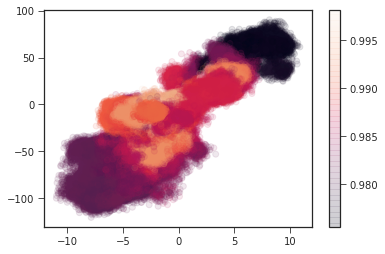

In [163]:
com = np.concatenate(weights[0])
f, ax = plt.subplots()
h = ax.scatter(cv_arr[::s, 0], cv_arr[::s, 1], c=com[::s], cmap="rocket", alpha=0.1)
plt.colorbar(h, ax=ax)

In [164]:
dens_all[0].min()

0.0

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


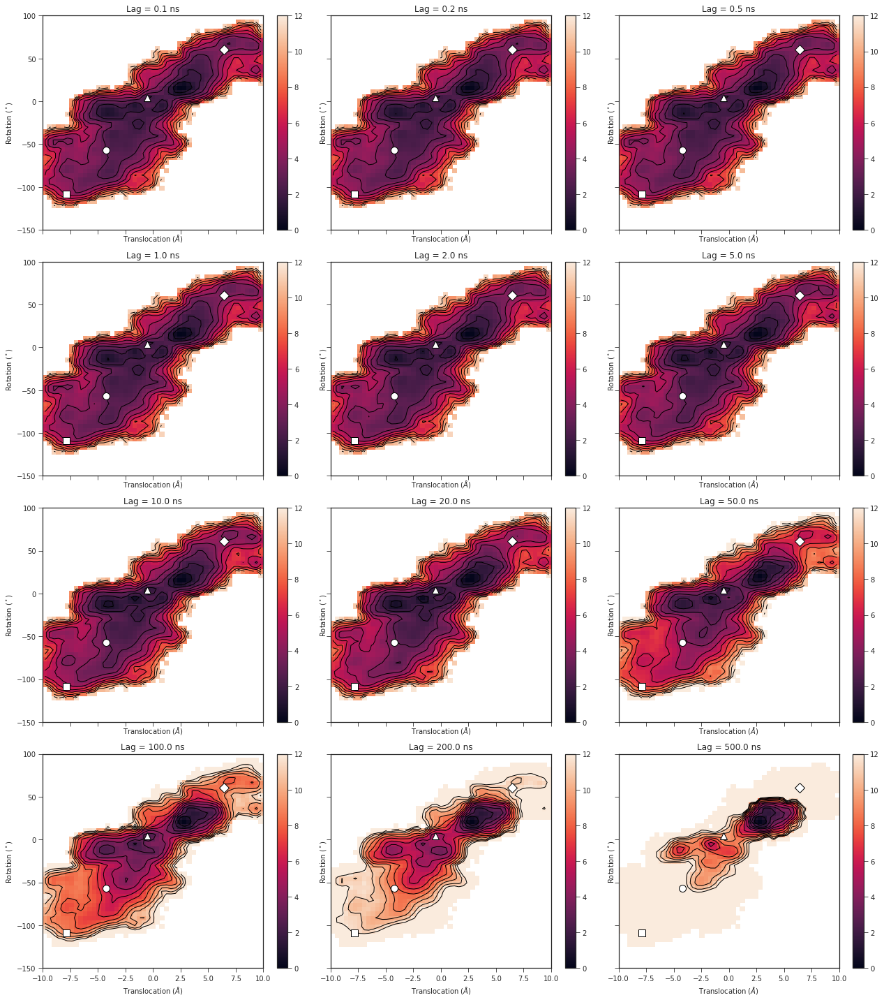

In [179]:
clines = np.linspace(0, 12, 13)
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2

f, axes = plt.subplots(4, 3, figsize=(18, 20), sharex=True, sharey=True)
for i, (lag, ax, pmf) in enumerate(zip(lags, axes.flat, dens_all)):
    # calculate energy difference against minimum
    min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
    diff = -np.log(pmf.T) - min_energy
    h = ax.pcolor(xlim, ylim, diff, cmap="rocket", vmax=12)
    plt.colorbar(h, ax=ax)
    ax.contour(
        centerx,
        centery,
        diff,
        levels=clines,
        colors="black",
        linestyles="solid",
        linewidths=1,
    )
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax, centroids=True)
f.tight_layout()

## Committors 

In [164]:
in_domain = np.split(mask, traj_inds)
in_domain[0].shape

(10000,)

In [165]:
len(in_domain)

237

In [166]:
q_downup, q_updown, qb_downup, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(
        extq.dga.forward_committor_sparse(basisF, com, in_domain, guessU, lag)
    )
    qb_downup.append(
        extq.dga.backward_committor_sparse(basisF, com, in_domain, guessD, lag)
    )
    q_updown.append(
        extq.dga.forward_committor_sparse(basisF, com, in_domain, guessD, lag)
    )
    qb_updown.append(
        extq.dga.backward_committor_sparse(basisF, com, in_domain, guessU, lag)
    )

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000
Calculating committors for lag 5000


In [66]:
q_downup, qb_downup, q_updown, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(
        extq.dga.forward_committor(basisF_test, com, in_domain, guessU, lag)
    )
    qb_downup.append(
        extq.dga.backward_committor(basisF_test, com, in_domain, guessD, lag)
    )
    q_updown.append(
        extq.dga.forward_committor(basisF_test, com, in_domain, guessD, lag)
    )
    qb_updown.append(
        extq.dga.backward_committor(basisF_test, com, in_domain, guessU, lag)
    )

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000
Calculating committors for lag 5000


In [189]:
lag

1

In [190]:
basisF[0].shape

(10000, 500)

In [192]:
com.shape

(237,)

In [195]:
iy = np.minimum(
    np.arange(lag, len(in_domain[0])), extq.stop.forward_stop(in_domain[0])[:-lag]
)

In [196]:
iy

array([   1,    2,    3, ..., 9997, 9998, 9999])

In [205]:
assert np.all(iy < len(in_domain[0]))

In [206]:
assert np.all(com[0][-lag:] == 0.0)

In [200]:
test = basisF[0][iy] - basisF[0][:-lag]

In [203]:
a = 0

In [204]:
a += basisF[0][:-lag].T @ sparse.diags(com[0][:-lag]) @ test

In [167]:
np.save("../../data/feat5_tica_ind500_uu/q_downup", q_downup)
np.save("../../data/feat5_tica_ind500_uu/qb_downup", qb_downup)
np.save("../../data/feat5_tica_ind500_uu/q_updown", q_updown)
np.save("../../data/feat5_tica_ind500_uu/qb_updown", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


### plot 2d projections

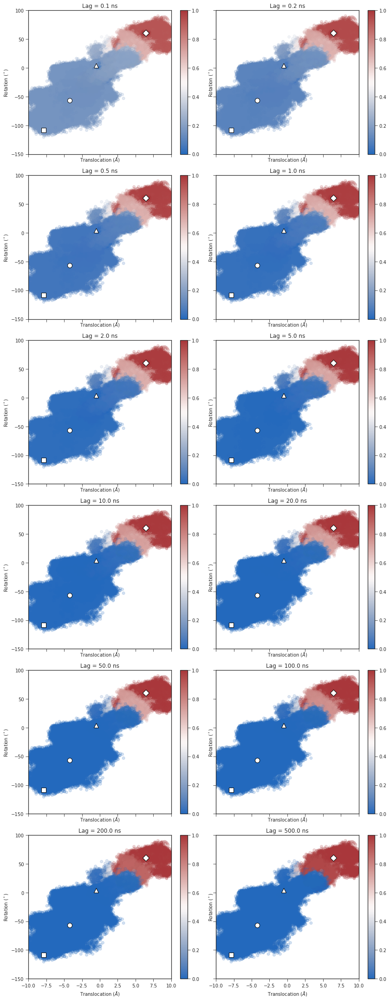

In [168]:
s = 10
f, axs = plt.subplots(6, 2, figsize=(12, 30), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*cv_arr[::s].T, c=q_arr[::s], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax, centroids=True)
f.tight_layout()

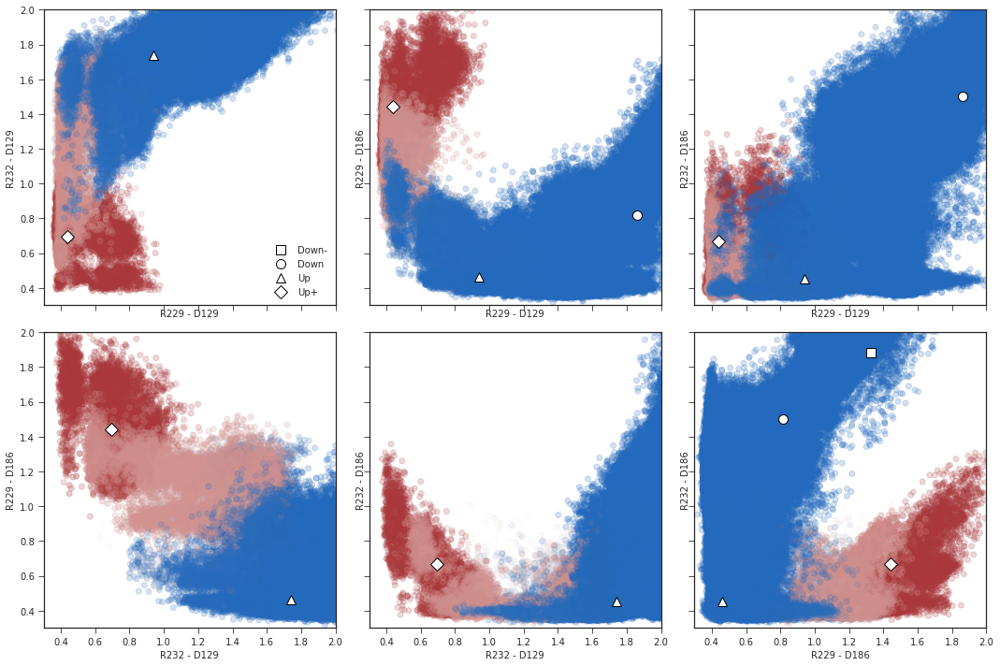

In [172]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 100 ns lag
s = 10
q_arr = np.concatenate(q_downup[9]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_arr[::s, sb1], sb_arr[::s, sb2], c=q_arr[::s], cmap="vlag", alpha=0.2)
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])

f.tight_layout()

In [187]:
%matplotlib inline

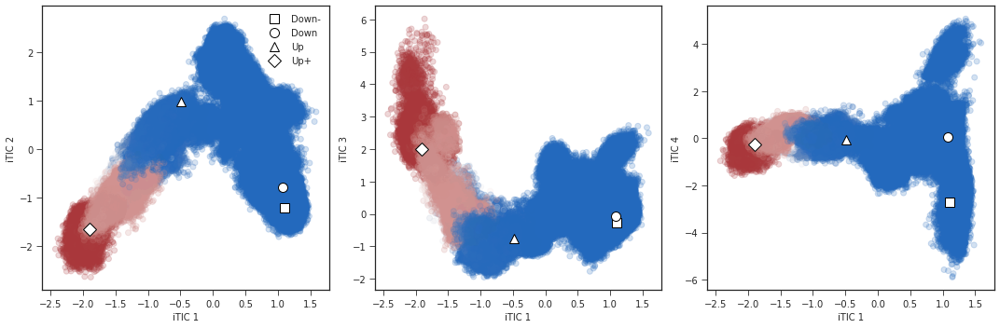

In [190]:
f, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=True)
q_arr = np.concatenate(q_downup[9]).clip(min=0.0, max=1.0)
for i, ax in enumerate(axes):
    ax.scatter(
        ivac_arr[::s, 1], ivac_arr[::s, i + 2], c=q_arr[::s], cmap="vlag", alpha=0.2
    )
    ax.set(xlabel=f"iTIC 1", ylabel=f"iTIC {i + 2}")
util.plot_models(axes[0], ivac_models[:, 1:3])
util.plot_models(axes[1], ivac_models[:, 1:4:2])
util.plot_models(axes[2], ivac_models[:, 1:5:3])
axes[0].legend(["Down-", "Down", "Up", "Up+"])

f.tight_layout()

### 3d projections

In [173]:
%matplotlib notebook

<IPython.core.display.Javascript object>


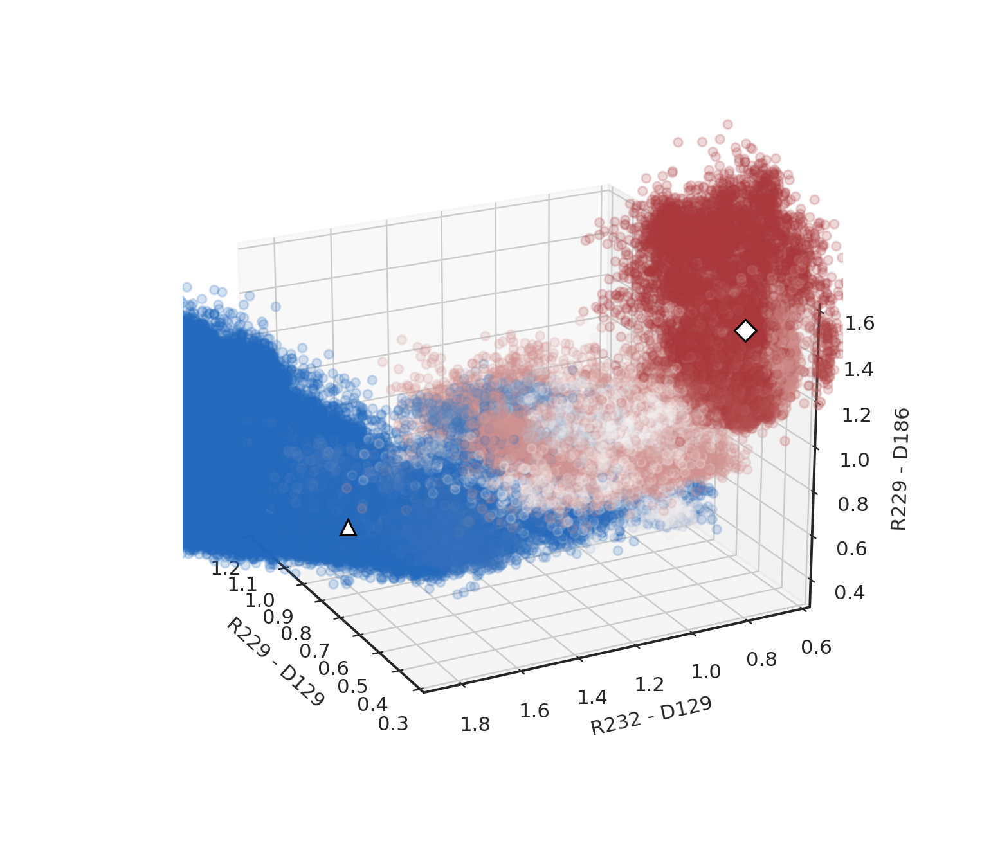

In [174]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[9]).clip(min=0, max=1)
ax.scatter(
    data_arr[::10, sb_ids[0]],
    data_arr[::10, sb_ids[1]],
    data_arr[::10, sb_ids[2]],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
ax.set_xlabel(sb_labels[sb_ids[0] - 30])
ax.set_ylabel(sb_labels[sb_ids[1] - 30])
ax.set_zlabel(sb_labels[sb_ids[2] - 30])
ax.set_xlim([0.3, 1.2])
ax.set_ylim([0.6, 1.9])
ax.set_zlim([0.3, 1.6])

ax.plot(
    feat2_models[3, sb_ids[0]],
    feat2_models[3, sb_ids[1]],
    feat2_models[3, sb_ids[2]],
    "D",
    mec="k",
    mfc="w",
    ms=8,
)
ax.plot(
    feat2_models[2, sb_ids[0]],
    feat2_models[2, sb_ids[1]],
    feat2_models[2, sb_ids[2]],
    "^",
    mec="k",
    mfc="w",
    ms=8,
)
ax.view_init(elev=20, azim=140)

plt.show()

<IPython.core.display.Javascript object>


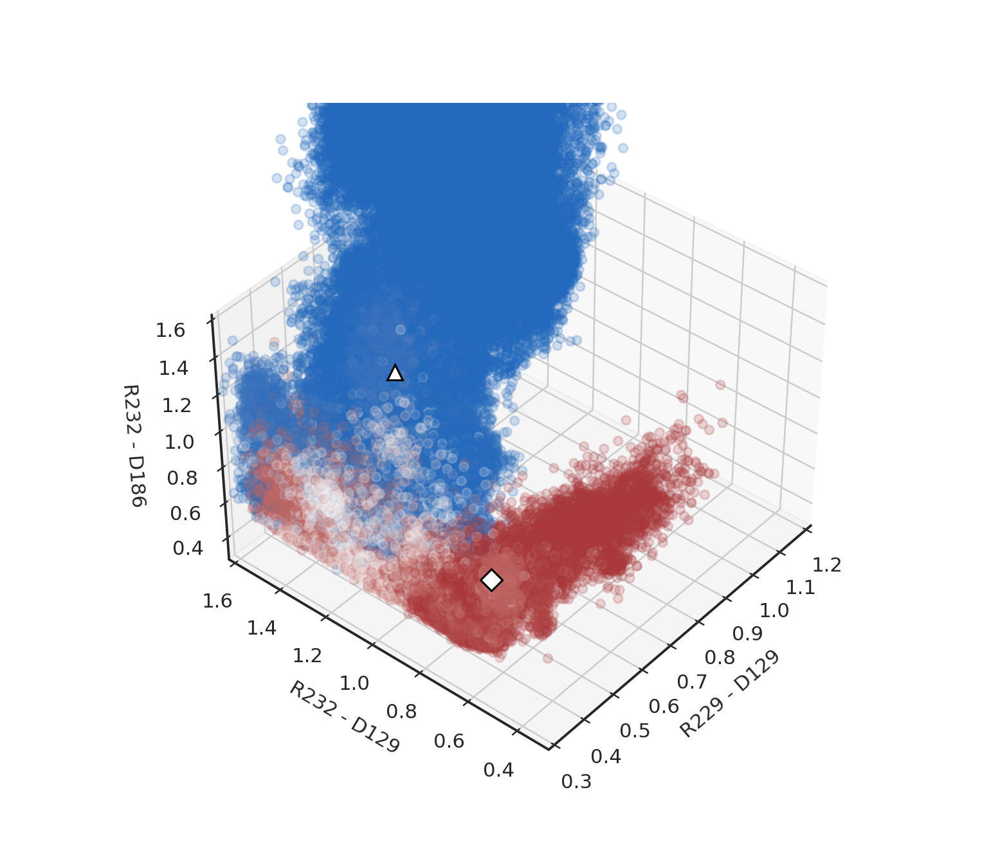

In [176]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[10]).clip(min=0, max=1)
ax.scatter(
    data_arr[::10, sb_ids[0]],
    data_arr[::10, sb_ids[1]],
    data_arr[::10, sb_ids[3]],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
ax.set_xlabel(sb_labels[sb_ids[0] - 30])
ax.set_ylabel(sb_labels[sb_ids[1] - 30])
ax.set_zlabel(sb_labels[sb_ids[3] - 30])
ax.set_xlim([0.3, 1.2])
ax.set_ylim([0.3, 1.6])
ax.set_zlim([0.3, 1.6])

ax.plot(
    feat2_models[3, sb_ids[0]],
    feat2_models[3, sb_ids[1]],
    feat2_models[3, sb_ids[3]],
    "D",
    mec="k",
    mfc="w",
    ms=8,
)
ax.plot(
    feat2_models[2, sb_ids[0]],
    feat2_models[2, sb_ids[1]],
    feat2_models[2, sb_ids[3]],
    "^",
    mec="k",
    mfc="w",
    ms=8,
)
ax.view_init(elev=40, azim=-140)

plt.show()

<IPython.core.display.Javascript object>


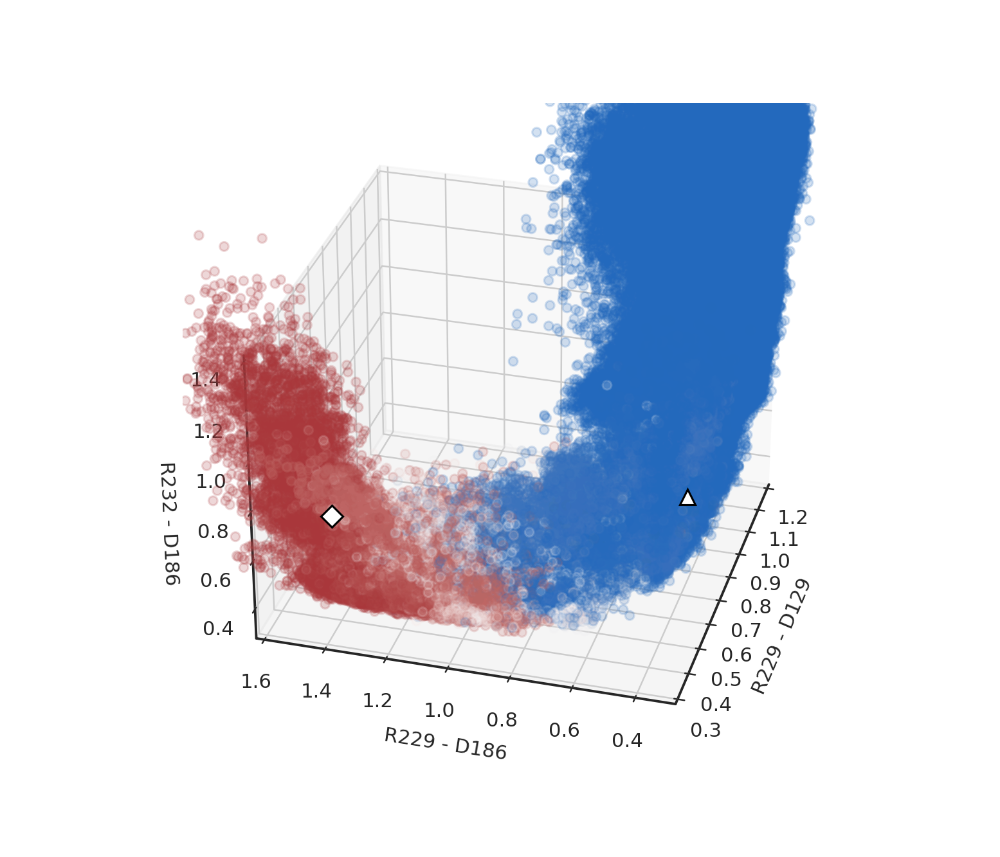

In [177]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[10]).clip(min=0, max=1)
ax.scatter(
    data_arr[::10, sb_ids[0]],
    data_arr[::10, sb_ids[2]],
    data_arr[::10, sb_ids[3]],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
ax.set_xlabel(sb_labels[sb_ids[0] - 30])
ax.set_ylabel(sb_labels[sb_ids[2] - 30])
ax.set_zlabel(sb_labels[sb_ids[3] - 30])
ax.set_xlim([0.3, 1.2])
ax.set_ylim([0.3, 1.6])
ax.set_zlim([0.3, 1.4])

ax.plot(
    feat2_models[3, sb_ids[0]],
    feat2_models[3, sb_ids[2]],
    feat2_models[3, sb_ids[3]],
    "D",
    mec="k",
    mfc="w",
    ms=8,
)
ax.plot(
    feat2_models[2, sb_ids[0]],
    feat2_models[2, sb_ids[2]],
    feat2_models[2, sb_ids[3]],
    "^",
    mec="k",
    mfc="w",
    ms=8,
)
# ax.view_init(elev=40, azim=-140)

plt.show()

<IPython.core.display.Javascript object>


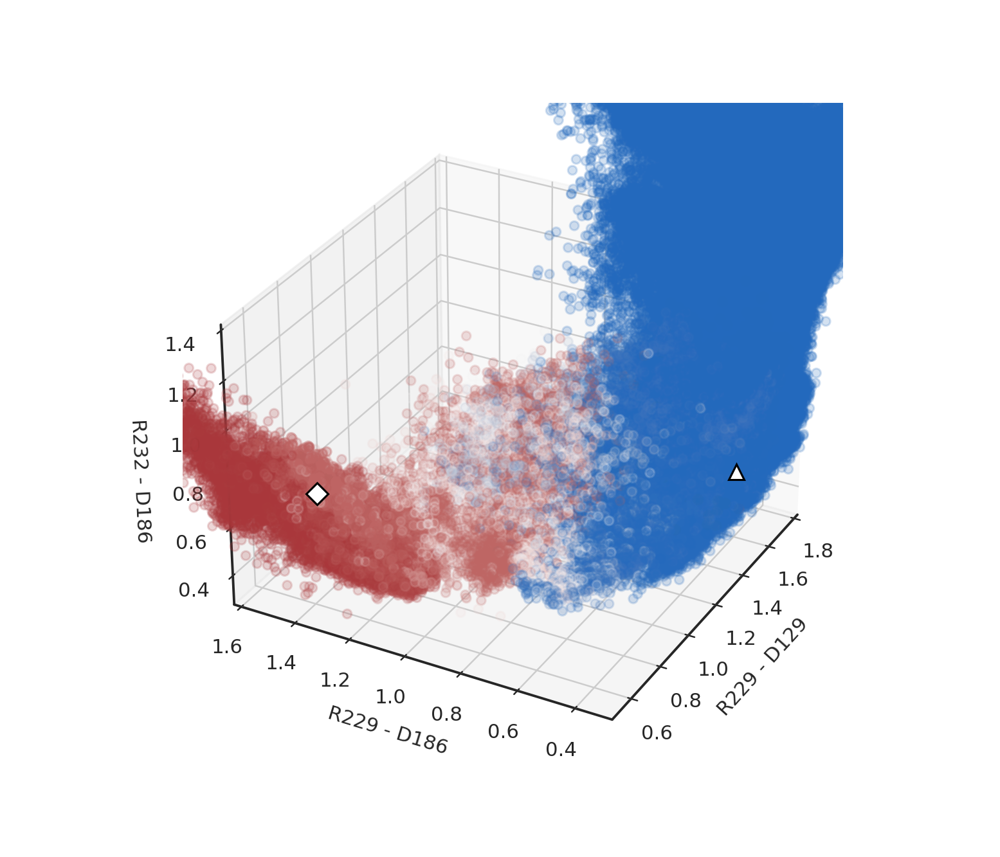

In [178]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[10]).clip(min=0, max=1)
ax.scatter(
    data_arr[::10, sb_ids[1]],
    data_arr[::10, sb_ids[2]],
    data_arr[::10, sb_ids[3]],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
ax.set_xlabel(sb_labels[sb_ids[0] - 30])
ax.set_ylabel(sb_labels[sb_ids[2] - 30])
ax.set_zlabel(sb_labels[sb_ids[3] - 30])
ax.set_xlim([0.5, 1.8])
ax.set_ylim([0.3, 1.6])
ax.set_zlim([0.3, 1.4])

ax.plot(
    feat2_models[3, sb_ids[1]],
    feat2_models[3, sb_ids[2]],
    feat2_models[3, sb_ids[3]],
    "D",
    mec="k",
    mfc="w",
    ms=8,
)
ax.plot(
    feat2_models[2, sb_ids[1]],
    feat2_models[2, sb_ids[2]],
    feat2_models[2, sb_ids[3]],
    "^",
    mec="k",
    mfc="w",
    ms=8,
)
ax.view_init(elev=30, azim=-110)

plt.show()

In [179]:
centroids = np.loadtxt("../../models/MD-clustering-center/all.txt")

<IPython.core.display.Javascript object>


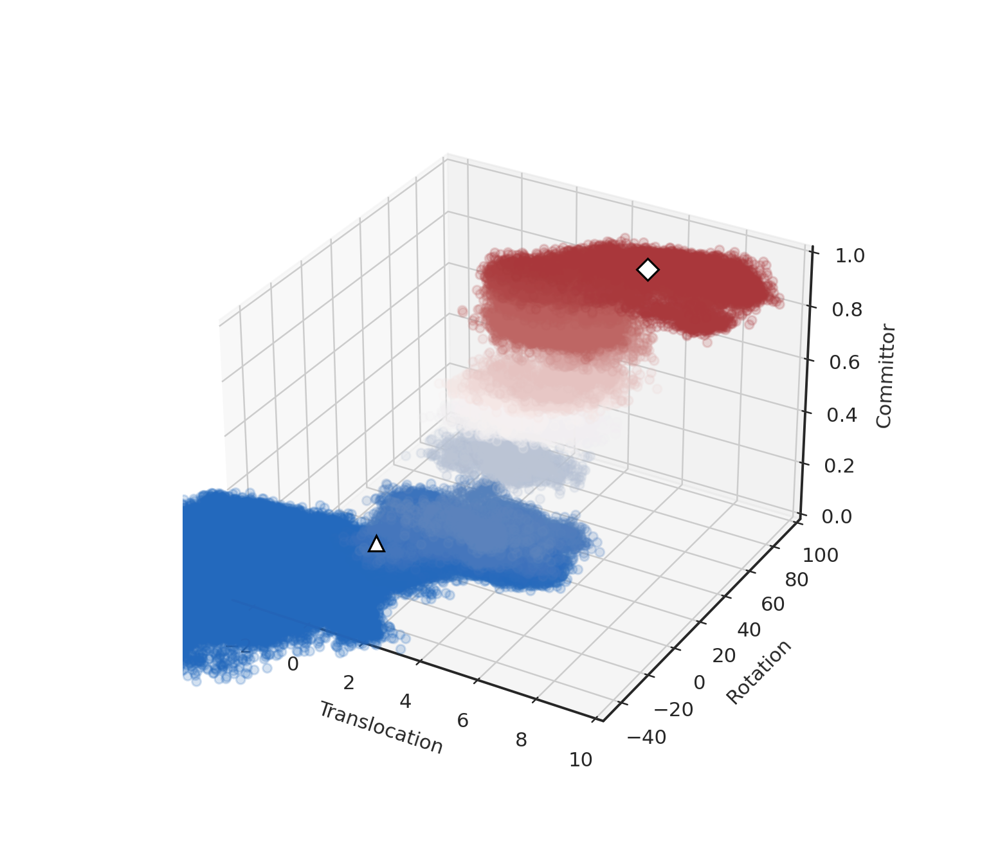

In [180]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

s = 10
q = np.concatenate(q_downup[10]).clip(min=0, max=1)
ax.scatter(cv_arr[::s, 0], cv_arr[::s, 1], q[::s], c=q[::10], cmap="vlag", alpha=0.2)
ax.set_xlabel("Translocation")
ax.set_ylabel("Rotation")
ax.set_zlabel("Committor")
ax.set_xlim([-2.5, 10])
ax.set_ylim([-50, 100])
ax.set_zlim([0, 1.0])

ax.plot(centroids[3, 0], centroids[3, 1], 1, "D", mec="k", mfc="w", ms=8)
ax.plot(centroids[2, 0], centroids[2, 1], 0, "^", mec="k", mfc="w", ms=8)

In [192]:
%matplotlib notebook

<IPython.core.display.Javascript object>


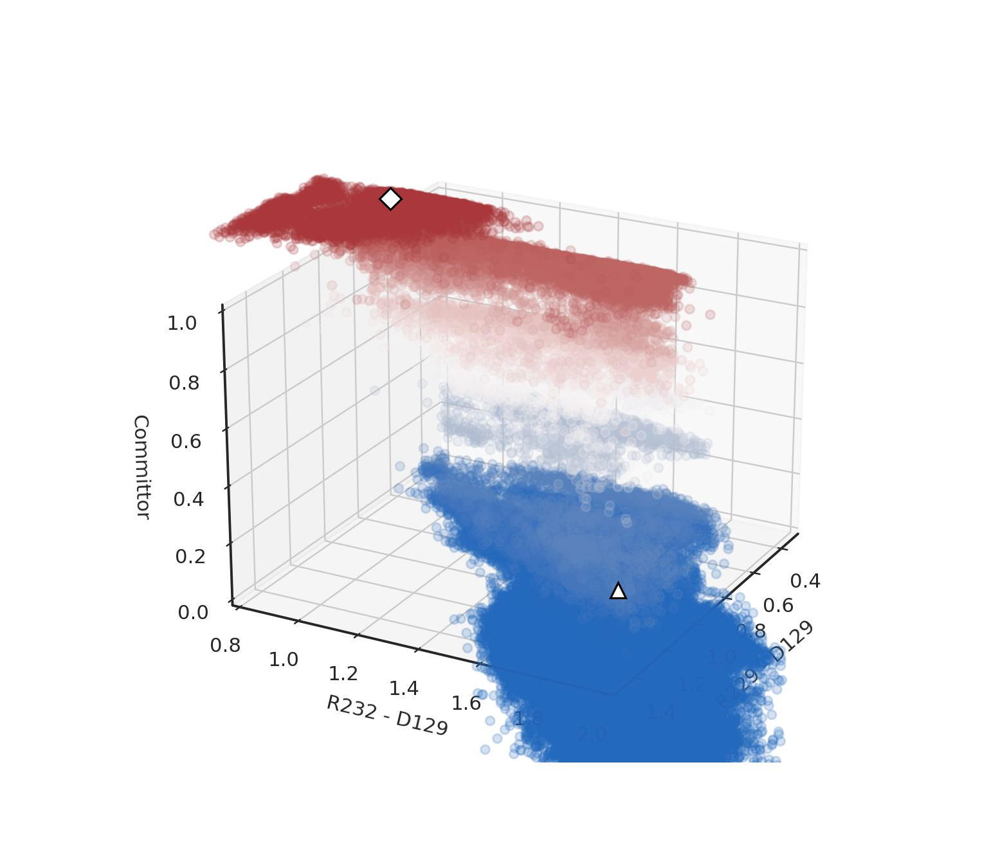

In [193]:
f = plt.figure(figsize=(7, 6))
ax = f.add_subplot(projection="3d")

s = 10
q = np.concatenate(q_downup[10]).clip(min=0, max=1)
ax.scatter(
    sb_arr[::s, sb_ids[0]],
    sb_arr[::s, sb_ids[1]],
    q[::s],
    c=q[::10],
    cmap="vlag",
    alpha=0.2,
)
ax.set_xlabel(f"{sb_labels[sb_ids[0] - 30]}")
ax.set_ylabel(f"{sb_labels[sb_ids[1] - 30]}")
ax.set_zlabel("Committor")
ax.set_xlim([0.3, 1.5])
ax.set_ylim([0.8, 2.0])
ax.set_zlim([0, 1.0])
ax.view_init(elev=25, azim=60)

ax.plot(
    feat2_models[3, sb_ids[0]],
    feat2_models[3, sb_ids[1]],
    1,
    "D",
    mec="k",
    mfc="w",
    ms=8,
)
ax.plot(
    feat2_models[2, sb_ids[0]],
    feat2_models[2, sb_ids[1]],
    0,
    "^",
    mec="k",
    mfc="w",
    ms=8,
)

In [182]:
np.unique(q).shape

(502,)

*Problem*: too many extraneous states which are "using" up the indicator functions, leaving the transition region poorly resolved

In [191]:
ids = np.argsort((q - 0.5) ** 2)
for i in ids[20:40]:
    print(util.anton_frame(i), cv_arr[i], q[i])

(91, 5544) [ 3.265 34.013] 0.49747406154305635
(30, 7265) [ 2.326 41.754] 0.49747406154305635
(30, 7264) [ 1.732 40.201] 0.49747406154305635
(84, 6770) [ 1.985 31.924] 0.49747406154305635
(84, 1279) [ 1.726 26.16 ] 0.49747406154305635
(84, 6763) [ 3.031 39.926] 0.49747406154305635
(95, 7551) [ 4.322 42.146] 0.49747406154305635
(91, 5395) [ 2.266 37.36 ] 0.49747406154305635
(91, 5381) [ 3.014 41.589] 0.49747406154305635
(92, 7417) [ 2.777 26.641] 0.49747406154305635
(95, 7285) [ 3.262 44.782] 0.49747406154305635
(91, 5328) [ 3.46  38.852] 0.49747406154305635
(91, 5332) [ 3.309 39.968] 0.49747406154305635
(95, 7299) [ 3.398 43.488] 0.49747406154305635
(91, 5336) [ 2.753 35.014] 0.49747406154305635
(91, 5346) [ 3.223 39.18 ] 0.49747406154305635
(91, 5350) [ 3.234 39.233] 0.49747406154305635
(91, 5352) [ 3.203 38.299] 0.49747406154305635
(84, 3167) [ 2.051 35.606] 0.49747406154305635
(91, 5353) [ 3.425 35.488] 0.49747406154305635


# 300 basis functions 

In [68]:
# cluster IVAC/TICA data
km = pyemma.coordinates.cluster_mini_batch_kmeans(
    data=ivac_arr, k=300, max_iter=100, n_jobs=40
)

12-07-21 10:22:04 pyemma.coordinates.clustering.kmeans.MiniBatchKmeansClustering[0] INFO     Cluster centers converged after 26 steps.


In [69]:
dtrajs300 = km.dtrajs[0]

In [70]:
np.save("../../data/raw_feat/feat5_ivac_ind300_anton", dtrajs300)

In [120]:
# assemble basis using sparse matrices
nclusters = 300

rows, cols = [], []
for i in range(nclusters):
    pts = np.argwhere(dtrajs300 == i)
    # indices of which frames are in the cluster i
    rows.append(pts.squeeze())
    # all assigned as 1 in the basis
    cols.append(np.repeat(i, len(pts)))
rows = np.hstack(rows)
cols = np.hstack(cols)
data = np.ones(len(rows), dtype=float)
basis300 = sparse.csr_matrix((data, (rows, cols)), shape=(len(cv_arr), nclusters))

In [121]:
basis300.shape

(3000000, 300)

In [122]:
basis300.count_nonzero()

3000000

In [73]:
dtrajs300[:20]

array([277, 230, 217, 217, 217, 217, 217, 277, 217, 277, 217, 217, 217,
       217,  32, 277, 114, 217, 217, 277], dtype=int32)

In [104]:
dtrajs300[-10:]

array([122, 122, 276, 276, 276, 122, 122, 276, 122, 122], dtype=int32)

In [135]:
print(basis300[:10:, 277])

  (0, 0)	1.0
  (7, 0)	1.0
  (9, 0)	1.0


In [125]:
# enforce boundary conditions for committor calculations
basisL_arr = basis300
basis300[up_ids] = 0
basis300[upplus_ids] = 0

# split into lists of arrays
basisF, basisL = [], []
curr = 0
for t_len in traj_lens:
    basisF.append(basis300[curr : curr + t_len])
    basisL.append(basisL_arr[curr : curr + t_len])
    curr += t_len

print(len(basisF), basisF[0].shape)
print(len(basisL), basisL[0].shape)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


237 (10000, 300)
237 (10000, 300)


In [126]:
basisF[-1].A[-10:, 122]

array([1., 1., 0., 0., 0., 1., 1., 0., 1., 1.])

In [127]:
basis300.count_nonzero()

2989658

In [91]:
type(basisF[0])

scipy.sparse.csr.csr_matrix

In [96]:
np.array(basis300)

array(<3000000x300 sparse matrix of type '<class 'numpy.bool_'>'
	with 6092258 stored elements in Compressed Sparse Row format>,
      dtype=object)

In [111]:
basis300[:, 0].count_nonzero()

15714

In [113]:
np.count_nonzero(dtrajs300 == 0)

15714

In [115]:
basisF[0][:, 217].count_nonzero()

1953

In [116]:
np.count_nonzero(dtrajs300[:10000] == 217)

1953

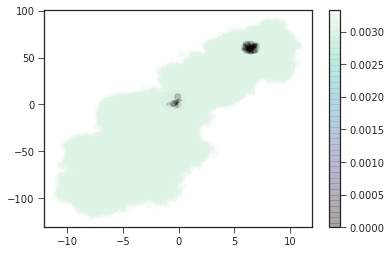

In [110]:
plt.scatter(*cv_arr[::s].T, c=np.mean(basis300.A, axis=1)[::s], alpha=0.2, cmap="mako")
plt.colorbar()

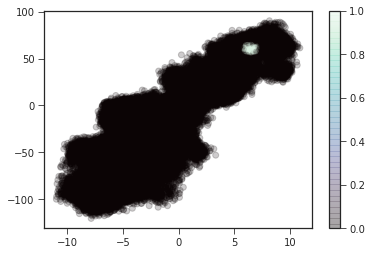

In [117]:
plt.scatter(*cv_arr[::s].T, c=guess_upp[::s], alpha=0.2, cmap="mako")
plt.colorbar()

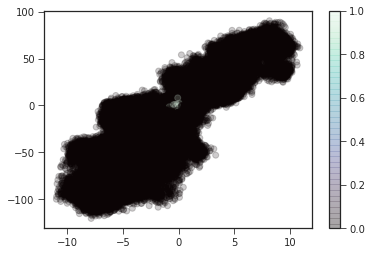

In [118]:
plt.scatter(*cv_arr[::s].T, c=guess_up[::s], alpha=0.2, cmap="mako")
plt.colorbar()

## weights 

In [128]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight_sparse(basisL, lag)
    weights.append(com)

Computing change of measure for lag 1
Computing change of measure for lag 2
Computing change of measure for lag 5
Computing change of measure for lag 10
Computing change of measure for lag 20
Computing change of measure for lag 50
Computing change of measure for lag 100
Computing change of measure for lag 200
Computing change of measure for lag 500
Computing change of measure for lag 1000
Computing change of measure for lag 2000
Computing change of measure for lag 5000


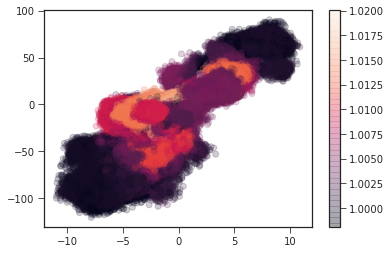

In [129]:
com = np.concatenate(weights[0])
plt.scatter(*cv_arr[::10].T, c=com[::10], alpha=0.2, cmap="rocket")
plt.colorbar()

## PMFs 

In [130]:
dens_all = []
dist_trajs = [traj[:, 0] for traj in cv_trajs]
rot_trajs = [traj[:, 1] for traj in cv_trajs]
xlim = np.linspace(-10, 10, 50)
ylim = np.linspace(-150, 100, 50)

for (com, lag) in zip(weights, lags):
    print(f"Density for lag {lag}")
    dens_all.append(extq.projection.density2d(dist_trajs, rot_trajs, com, xlim, ylim))

Density for lag 1
Density for lag 2
Density for lag 5
Density for lag 10
Density for lag 20
Density for lag 50
Density for lag 100
Density for lag 200
Density for lag 500
Density for lag 1000
Density for lag 2000
Density for lag 5000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log
  if __name__ == '__main__':


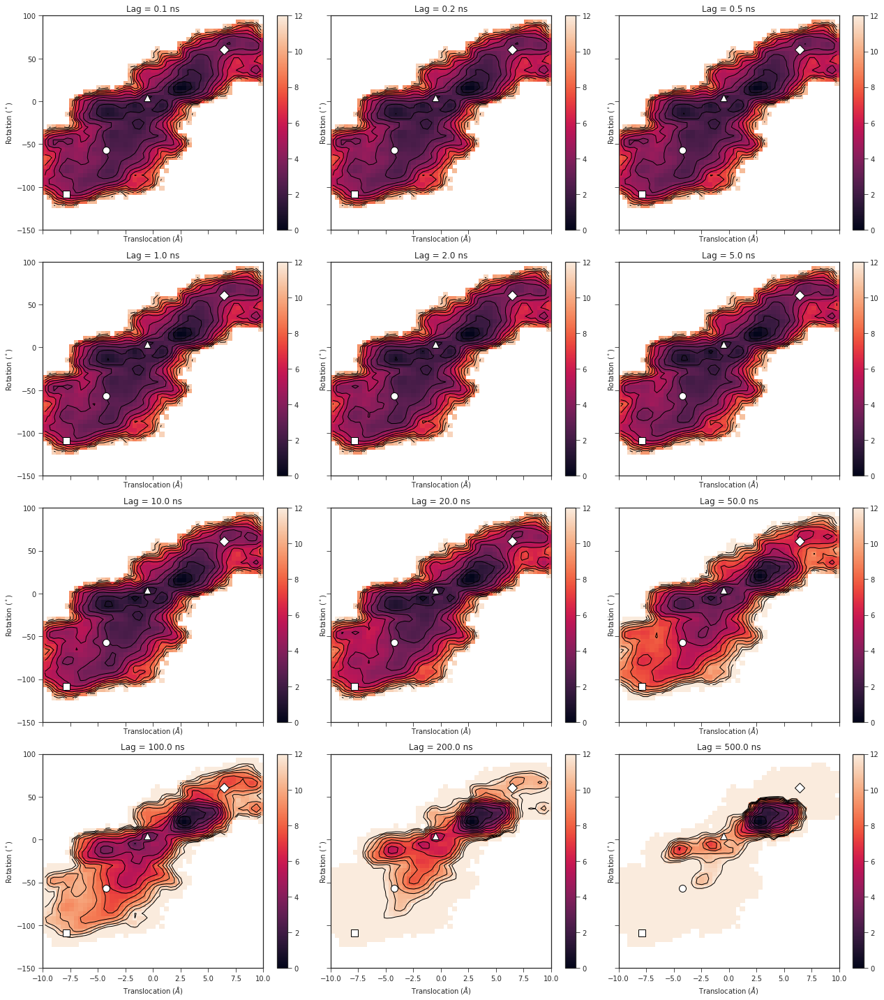

In [131]:
clines = np.linspace(0, 12, 13)
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2

f, axes = plt.subplots(4, 3, figsize=(18, 20), sharex=True, sharey=True)
for i, (lag, ax, pmf) in enumerate(zip(lags, axes.flat, dens_all)):
    # calculate energy difference against minimum
    min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
    diff = -np.log(pmf.T) - min_energy
    h = ax.pcolor(xlim, ylim, diff, cmap="rocket", vmax=12)
    plt.colorbar(h, ax=ax)
    ax.contour(
        centerx,
        centery,
        diff,
        levels=clines,
        colors="black",
        linestyles="solid",
        linewidths=1,
    )
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax, centroids=True)
f.tight_layout()

## committors 

In [84]:
mask.shape

(3000000,)

In [85]:
mask[:10]

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True])

In [86]:
weights = np.load("../../data/coms_feat5_ind200_anton.npy", allow_pickle=True)

In [87]:
weights = [*weights[:11], weights[-1]]

In [88]:
print(len(weights), len(weights[0]), weights[0][0].shape)

12 237 (10000,)


In [132]:
q_downup, q_updown, qb_downup, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(
        extq.dga.forward_committor_sparse(basisF, com, in_domain, guessU, lag)
    )
    qb_downup.append(
        extq.dga.backward_committor_sparse(basisF, com, in_domain, guessD, lag)
    )
    q_updown.append(
        extq.dga.forward_committor_sparse(basisF, com, in_domain, guessD, lag)
    )
    qb_updown.append(
        extq.dga.backward_committor_sparse(basisF, com, in_domain, guessU, lag)
    )

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000
Calculating committors for lag 5000


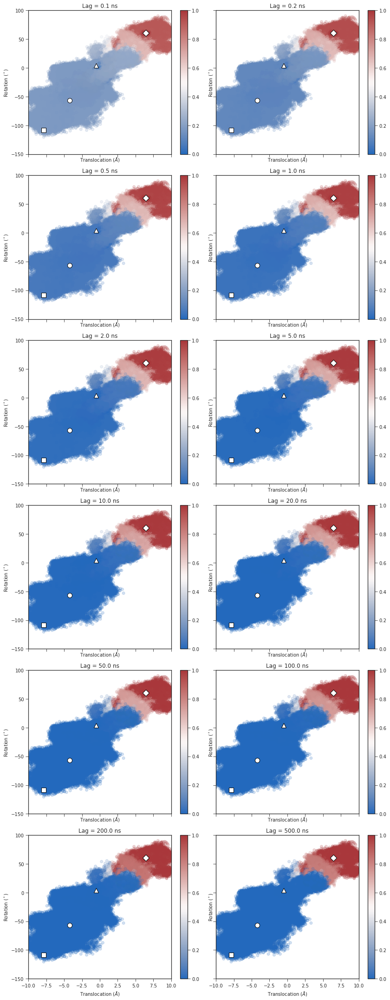

In [133]:
s = 10
f, axs = plt.subplots(6, 2, figsize=(12, 30), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q)
    h = ax.scatter(*cv_arr[::s].T, c=q_arr[::s], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax, centroids=True)
f.tight_layout()